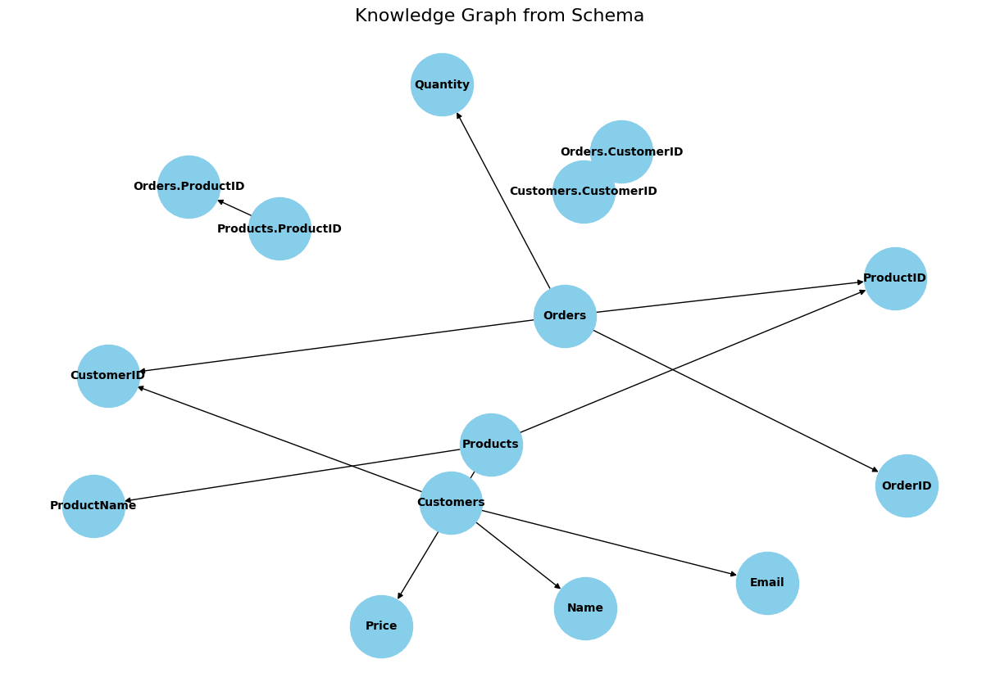

In [3]:
import networkx as nx
import matplotlib.pyplot as plt

kg = nx.DiGraph()  


nodes = [
    "Customers", "Orders", "Products",
    "CustomerID", "Name", "Email", 
    "OrderID", "ProductID", "Quantity",
    "ProductName", "Price"
]
kg.add_nodes_from(nodes)


edges = [
    ("Customers", "CustomerID"), ("Customers", "Name"), ("Customers", "Email"),
    ("Orders", "OrderID"), ("Orders", "CustomerID"), ("Orders", "ProductID"), ("Orders", "Quantity"),
    ("Products", "ProductID"), ("Products", "ProductName"), ("Products", "Price"),
    ("Customers.CustomerID", "Orders.CustomerID"),  
    ("Products.ProductID", "Orders.ProductID")      
]

kg.add_edges_from(edges)

plt.figure(figsize=(12, 8))
pos = nx.spring_layout(kg) 
nx.draw(kg, pos, with_labels=True, node_size=3000, node_color='skyblue', font_size=10, font_weight="bold")
plt.title("Knowledge Graph from Schema", fontsize=16)
plt.show()


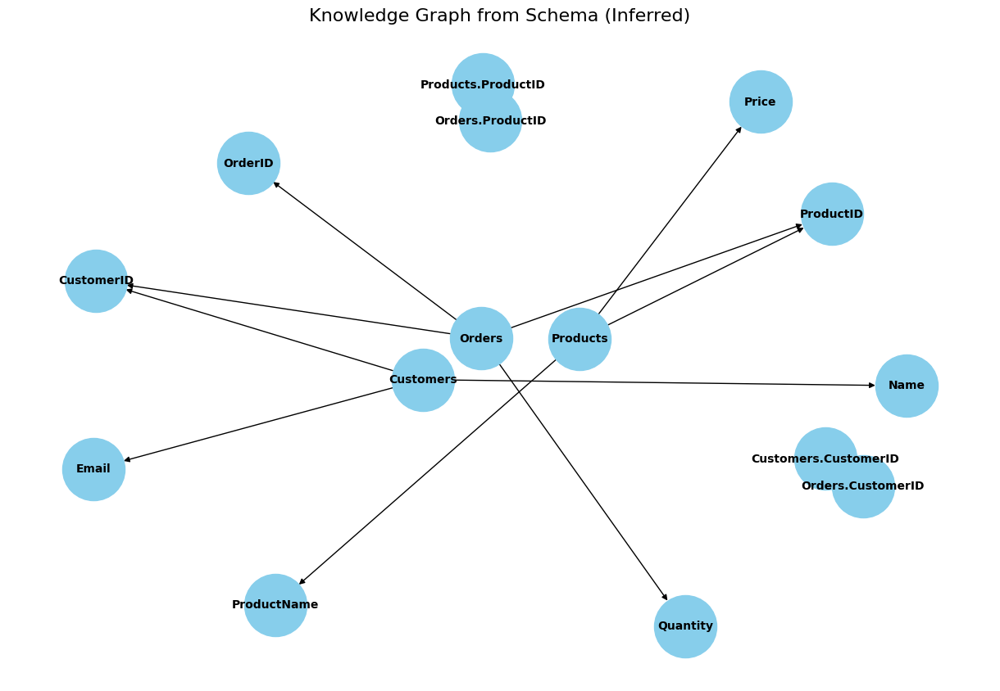

In [5]:
import networkx as nx
import matplotlib.pyplot as plt

schema = {
    "Customers": ["CustomerID", "Name", "Email"],
    "Orders": ["OrderID", "CustomerID", "ProductID", "Quantity"],
    "Products": ["ProductID", "ProductName", "Price"]
}

kg = nx.DiGraph()

for table, columns in schema.items():
    kg.add_node(table)
    for column in columns:
        kg.add_node(column)
        kg.add_edge(table, column)  

for table1, columns1 in schema.items():
    for table2, columns2 in schema.items():
        if table1 != table2: 
            common_columns = set(columns1) & set(columns2)  
            for column in common_columns:
                kg.add_edge(f"{table1}.{column}", f"{table2}.{column}")  

plt.figure(figsize=(12, 8))
pos = nx.spring_layout(kg)
nx.draw(kg, pos, with_labels=True, node_size=3000, node_color='skyblue', font_size=10, font_weight="bold")
plt.title("Knowledge Graph from Schema (Inferred)", fontsize=16)
plt.show()


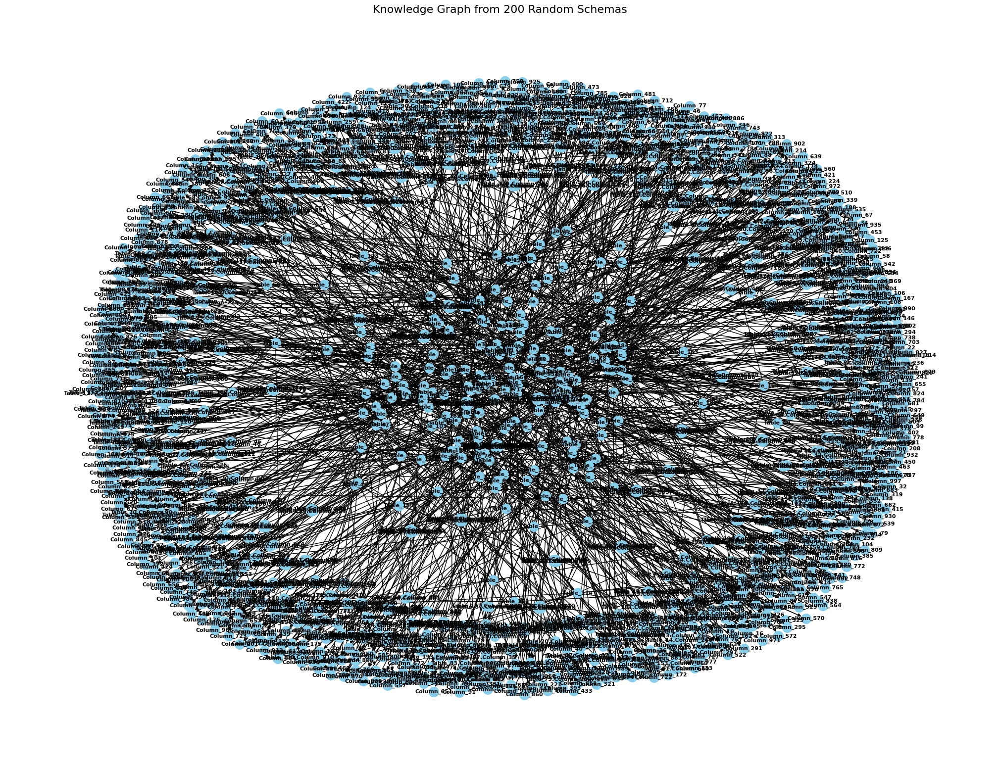

In [ ]:
import random
import networkx as nx
import matplotlib.pyplot as plt

def generate_random_schemas(num_tables=200, min_columns=3, max_columns=10):
    schemas = {}
    table_names = [f"Table_{i}" for i in range(1, num_tables + 1)]
    column_pool = [f"Column_{i}" for i in range(1, 1000)] 

    for table in table_names:
        num_columns = random.randint(min_columns, max_columns)
        schemas[table] = random.sample(column_pool, num_columns)

    return schemas

random_schemas = generate_random_schemas()

def create_knowledge_graph(schemas):
    kg = nx.DiGraph()

    for table, columns in schemas.items():
        kg.add_node(table)
        for column in columns:
            kg.add_node(column)
            kg.add_edge(table, column)  

    for table1, columns1 in schemas.items():
        for table2, columns2 in schemas.items():
            if table1 != table2:
                common_columns = set(columns1) & set(columns2)
                for column in common_columns:
                    kg.add_edge(f"{table1}.{column}", f"{table2}.{column}")  

    return kg

kg = create_knowledge_graph(random_schemas)

plt.figure(figsize=(20, 15))
pos = nx.spring_layout(kg, seed=42)  
nx.draw(
    kg, pos, with_labels=True, node_size=200, node_color='skyblue', font_size=8, font_weight="bold"
)
plt.title("Knowledge Graph from 200 Random Schemas", fontsize=16)
plt.show()


Total Tables: 200
Total Columns: 1294


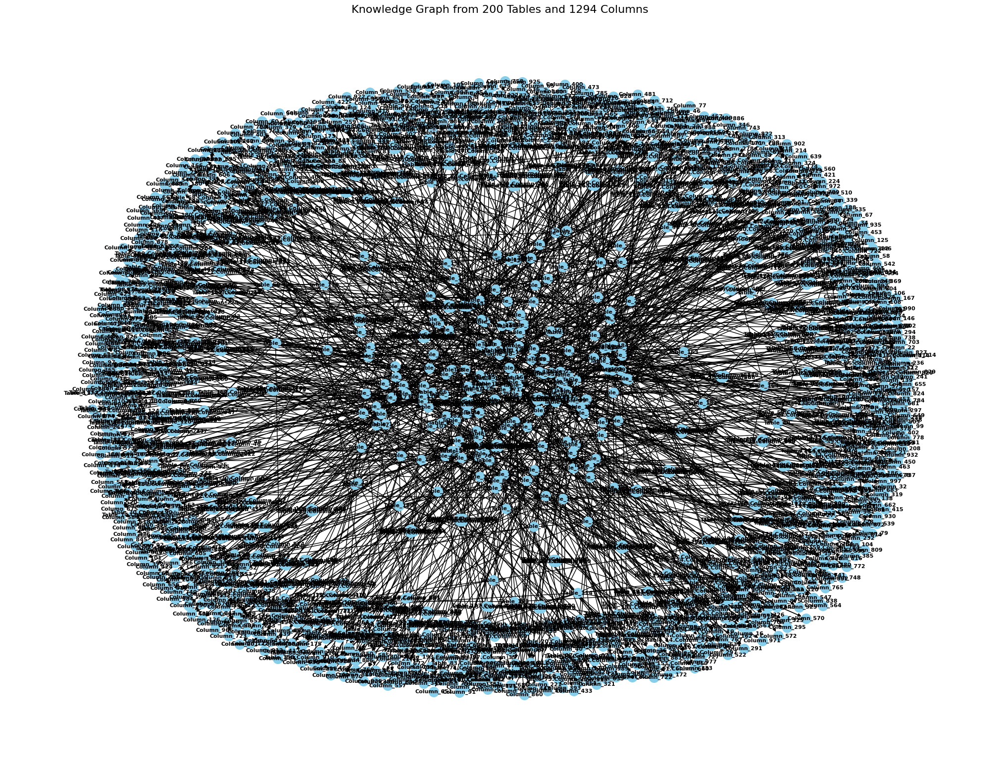

In [7]:
def summarize_schema(schemas):
    total_tables = len(schemas)
    total_columns = sum(len(columns) for columns in schemas.values())
    return total_tables, total_columns

total_tables, total_columns = summarize_schema(random_schemas)

print(f"Total Tables: {total_tables}")
print(f"Total Columns: {total_columns}")

plt.figure(figsize=(20, 15))
pos = nx.spring_layout(kg, seed=42)  
nx.draw(
    kg, pos, with_labels=True, node_size=200, node_color='skyblue', font_size=8, font_weight="bold"
)
plt.title(f"Knowledge Graph from {total_tables} Tables and {total_columns} Columns", fontsize=16)
plt.show()


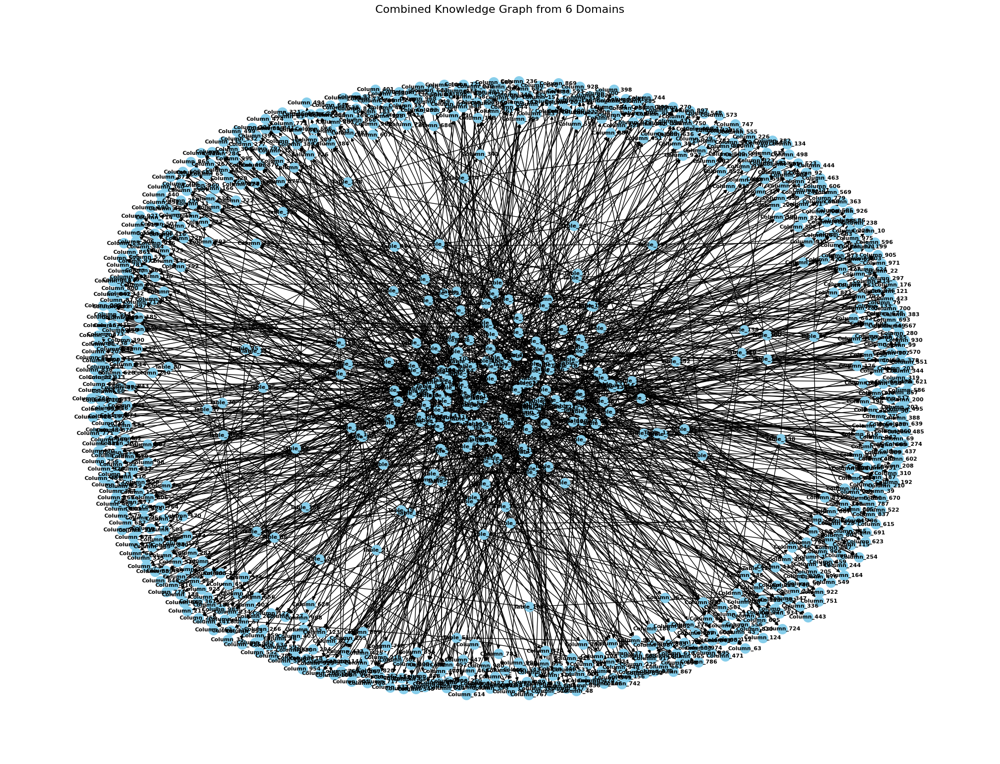

In [ ]:
import random
import networkx as nx
import matplotlib.pyplot as plt

def generate_domain_schemas(total_tables=200, num_domains=6, min_columns=3, max_columns=10):
    domain_schemas = {}
    table_pool = [f"Table_{i}" for i in range(1, total_tables + 1)]
    random.shuffle(table_pool) 
    tables_per_domain = total_tables // num_domains
    
    column_pool = [f"Column_{i}" for i in range(1, 1000)]
    
    for domain in range(1, num_domains + 1):
        domain_name = f"Domain_{domain}"
        domain_tables = table_pool[(domain - 1) * tables_per_domain:domain * tables_per_domain]
        domain_schemas[domain_name] = {
            table: random.sample(column_pool, random.randint(min_columns, max_columns))
            for table in domain_tables
        }
    
    return domain_schemas

domains = generate_domain_schemas()

def create_domain_knowledge_graph(schemas):
    kg = nx.DiGraph()
    for table, columns in schemas.items():
        kg.add_node(table)
        for column in columns:
            kg.add_node(column)
            kg.add_edge(table, column)
    return kg

domain_kgs = {}
for domain, schema in domains.items():
    domain_kgs[domain] = create_domain_knowledge_graph(schema)

def connect_domain_graphs(domain_kgs, cross_domain_links=10):
    combined_kg = nx.DiGraph()
    
    for domain, kg in domain_kgs.items():
        combined_kg = nx.compose(combined_kg, kg)
    
    all_nodes = list(combined_kg.nodes)
    for _ in range(cross_domain_links):
        node1 = random.choice(all_nodes)
        node2 = random.choice(all_nodes)
        if node1 != node2:  # Avoid self-loops
            combined_kg.add_edge(node1, node2)
    
    return combined_kg

combined_kg = connect_domain_graphs(domain_kgs)

plt.figure(figsize=(20, 15))
pos = nx.spring_layout(combined_kg, seed=42)
nx.draw(
    combined_kg, pos, with_labels=True, node_size=200, node_color='skyblue', font_size=8, font_weight="bold"
)
plt.title("Combined Knowledge Graph from 6 Domains", fontsize=16)
plt.show()
